In [9]:
import time
from pathlib import Path

import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rasterio
import torch
from huggingface_hub.errors import GatedRepoError
from matplotlib.patches import Patch, Rectangle
from shapely.geometry import box as skrzynka

plt.rcParams.update({"figure.dpi": 90, "axes.titlesize": 11})

SCIEZKA_ZDJECIA = Path("data/tampa_satelita.tif")
SCIEZKA_OSM = Path("data/tampa_osm.gpkg")
KATALOG_WYNIKOW = Path("wyniki/tampa_detekcja")
KATALOG_WYNIKOW.mkdir(parents=True, exist_ok=True)
ID_MODELU = "facebook/sam3"

URZADZENIE = "cuda" if torch.cuda.is_available() else "mps" if torch.backends.mps.is_available() else "cpu"

# Dwa kadry do prób (wiersze, kolumny) — farma zbiorników paliwa i śródmieście z basenami na dachach
FRAGMENT_ZBIORNIKI = np.s_[350:950, 1850:2450]
FRAGMENT_BASENY = np.s_[200:900, 400:1100]

# fraza (po angielsku, do SAM 3) -> warstwa referencyjna w tampa_osm.gpkg, do sekcji 4
POJECIE_NA_WARSTWE = {"storage tank": "zbiorniki", "swimming pool": "baseny", "building": "budynki"}
KOLORY = {"storage tank": "orange", "swimming pool": "deepskyblue", "building": "lime"}

print("Urządzenie:", URZADZENIE, "| torch", torch.__version__)

Urządzenie: mps | torch 2.14.0


Zdjęcie: 3800 x 4020 px, 1900 x 2010 m, GSD 0.5 m, układ EPSG:32617, ważnych pikseli: 100.00%


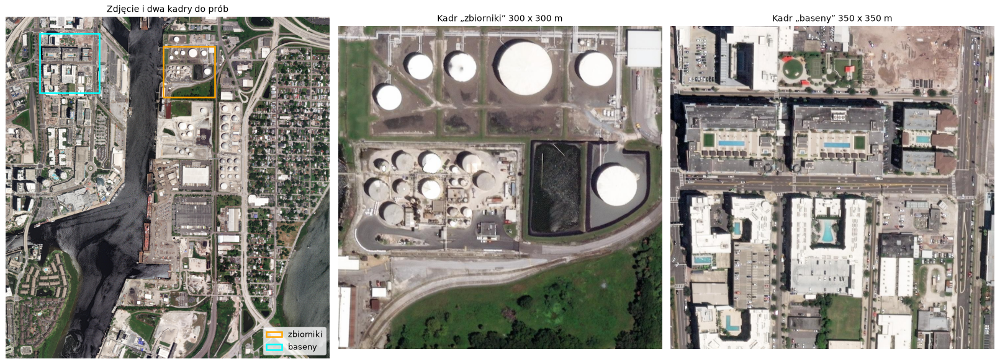

In [10]:
def wczytaj_zdjecie(sciezka):
    """Zwraca: rgb (H,W,3 uint8), waznie (H,W bool), profil (transform, crs), gsd [m/piksel]."""
    with rasterio.open(sciezka) as src:
        if src.count < 3 or src.dtypes[0] != "uint8":
            raise ValueError(f"Oczekuję 8-bitowego RGB, a jest: {src.count} pasm, {src.dtypes[0]}")
        rgb = np.moveaxis(src.read([1, 2, 3]), 0, -1)
        profil = {"transform": src.transform, "crs": src.crs}
        gsd = src.res[0]
    waznie = ~(rgb == 0).all(axis=-1)
    return rgb, waznie, profil, gsd


rgb, waznie, profil, gsd = wczytaj_zdjecie(SCIEZKA_ZDJECIA)
kadr_zbiorniki = rgb[FRAGMENT_ZBIORNIKI].copy()
kadr_baseny = rgb[FRAGMENT_BASENY].copy()

print(f"Zdjęcie: {rgb.shape[1]} x {rgb.shape[0]} px, {rgb.shape[1] * gsd:.0f} x {rgb.shape[0] * gsd:.0f} m, "
      f"GSD {gsd} m, układ {profil['crs']}, ważnych pikseli: {waznie.mean():.2%}")

fig, ax = plt.subplots(1, 3, figsize=(18, 6.6))
ax[0].imshow(rgb)
for frag, kolor, nazwa in [(FRAGMENT_ZBIORNIKI, "orange", "zbiorniki"), (FRAGMENT_BASENY, "cyan", "baseny")]:
    ax[0].add_patch(Rectangle((frag[1].start, frag[0].start), frag[1].stop - frag[1].start,
                              frag[0].stop - frag[0].start, fill=False, ec=kolor, lw=2, label=nazwa))
ax[0].legend(loc="lower right"); ax[0].set_title("Zdjęcie i dwa kadry do prób"); ax[0].axis("off")
ax[1].imshow(kadr_zbiorniki); ax[1].set_title("Kadr „zbiorniki” 300 x 300 m"); ax[1].axis("off")
ax[2].imshow(kadr_baseny); ax[2].set_title("Kadr „baseny” 350 x 350 m"); ax[2].axis("off")
plt.tight_layout()

In [11]:
def wczytaj_sam3(id_modelu=ID_MODELU):
    """Sam3Model + Sam3Processor wprost (AutoModel na tym checkpoincie trafia w wariant wideo). Wagi (ok. 3,4 GB)
    pobierają się przy pierwszym użyciu do cache Hugging Face."""
    from transformers import Sam3Model, Sam3Processor
    try:
        procesor = Sam3Processor.from_pretrained(id_modelu)
        model = Sam3Model.from_pretrained(id_modelu)
    except GatedRepoError as blad:
        raise RuntimeError(
            f"Brak dostępu do {id_modelu}. Wejdź na https://huggingface.co/{id_modelu}, zaloguj się, poproś o dostęp "
            "i przyjmij licencję (zatwierdzenie jest ręczne), a potem zaloguj się lokalnie: `hf auth login`."
        ) from blad
    return procesor, model.to(URZADZENIE).eval()


t0 = time.perf_counter()
procesor, model = wczytaj_sam3()
print(f"SAM 3 na urządzeniu: {URZADZENIE}, wczytany w {time.perf_counter() - t0:.1f} s "
      "(wagi już w cache Hugging Face — przy pierwszym pobraniu na nowej maszynie licz kilka-kilkanaście minut na ok. 3,4 GB)")

liczba_parametrow = lambda modul: sum(p.numel() for p in modul.parameters())
czesci = {
    "koder obrazu (ViT)": liczba_parametrow(model.vision_encoder),
    "koder tekstu": liczba_parametrow(model.text_encoder),
    "koder ramek wzorcowych": liczba_parametrow(model.geometry_encoder),
    "detektor DETR (enkoder + dekoder zapytań)": liczba_parametrow(model.detr_encoder) + liczba_parametrow(model.detr_decoder),
    "dekoder masek": liczba_parametrow(model.mask_decoder),
}
czesci["pozostałe"] = liczba_parametrow(model) - sum(czesci.values())
pd.Series(czesci, name="parametry").map(lambda n: f"{n / 1e6:.1f} mln")

Loading weights: 100%|██████████| 1468/1468 [00:00<00:00, 23739.57it/s]


SAM 3 na urządzeniu: mps, wczytany w 5.0 s (wagi już w cache Hugging Face — przy pierwszym pobraniu na nowej maszynie licz kilka-kilkanaście minut na ok. 3,4 GB)


koder obrazu (ViT)                           454.0 mln
koder tekstu                                 353.5 mln
koder ramek wzorcowych                         8.1 mln
detektor DETR (enkoder + dekoder zapytań)     21.0 mln
dekoder masek                                  2.3 mln
pozostałe                                      1.4 mln
Name: parametry, dtype: str

4 fraz na kadrze 600 x 600 px: 4.4 s


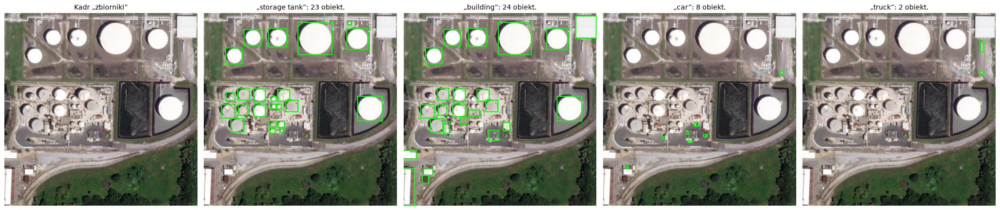

In [12]:
PROG = 0.5    # minimalna pewność obiektu


def koduj_obraz(obraz):
    """Ciężki krok: RGB uint8 (H,W,3) → cechy obrazu (do wielokrotnego użycia) i rozmiar oryginału [[H, W]]."""
    wejscie = procesor(images=obraz, return_tensors="pt")
    with torch.no_grad():
        cechy = model.get_vision_features(pixel_values=wejscie["pixel_values"].to(URZADZENIE))
    return cechy, wejscie["original_sizes"].tolist()


def znajdz_obiekty(cechy, rozmiar, pojecie, prog=PROG, wiersz0=0, kolumna0=0):
    """Lekki krok: fraza -> obiekty jako ramki w układzie CAŁEGO zdjęcia (przesunięte o wiersz0, kolumna0)."""
    wejscie = procesor(text=pojecie, return_tensors="pt")
    with torch.no_grad():
        wyjscie = model(vision_embeds=cechy, input_ids=wejscie["input_ids"].to(URZADZENIE),
                        attention_mask=wejscie["attention_mask"].to(URZADZENIE))
    wynik = procesor.post_process_object_detection(wyjscie, threshold=prog, target_sizes=rozmiar)[0]
    return [{"ramka": (kolumna0 + x1, wiersz0 + y1, kolumna0 + x2, wiersz0 + y2), "wynik": float(s), "pojecie": pojecie}
            for (x1, y1, x2, y2), s in zip(wynik["boxes"].tolist(), wynik["scores"].tolist())]


def rysuj_ramki(ax, obraz, obiekty, kolor="lime", offset=(0, 0)):
    """Rysuje ramki obiektów na obrazie (offset = (wiersz0, kolumna0) obrazu w układzie ramek)."""
    ax.imshow(obraz)
    w0, k0 = offset
    for o in obiekty:
        x1, y1, x2, y2 = o["ramka"]
        ax.add_patch(Rectangle((x1 - k0, y1 - w0), x2 - x1, y2 - y1, fill=False, ec=kolor, lw=1.6))
    ax.axis("off")


def pokaz_pojecia(obraz, wyniki, tytul_obrazu="Kadr", kolor="lime"):
    """Kadr i po jednym panelu na frazę: ramki + liczba obiektów."""
    fig, ax = plt.subplots(1, len(wyniki) + 1, figsize=(4.6 * (len(wyniki) + 1), 4.8))
    ax[0].imshow(obraz); ax[0].set_title(tytul_obrazu); ax[0].axis("off")
    for a, (fraza, obiekty) in zip(ax[1:], wyniki.items()):
        rysuj_ramki(a, obraz, obiekty, kolor=kolor)
        a.set_title(f"„{fraza}”: {len(obiekty)} obiekt.")
    plt.tight_layout()


POJECIA_PRZYKLAD = ["storage tank", "building", "car", "truck"]

t0 = time.perf_counter()
cechy_zbiorniki, rozmiar_zbiorniki = koduj_obraz(kadr_zbiorniki)
wyniki_kadru = {p: znajdz_obiekty(cechy_zbiorniki, rozmiar_zbiorniki, p, wiersz0=0, kolumna0=0) for p in POJECIA_PRZYKLAD}
print(f"{len(POJECIA_PRZYKLAD)} fraz na kadrze 600 x 600 px: {time.perf_counter() - t0:.1f} s")
pokaz_pojecia(kadr_zbiorniki, wyniki_kadru, "Kadr „zbiorniki”")

,obiektów,najwyższa pewność
storage tank,23.0,0.82
tank,14.0,0.62
fuel tank,0.0,NaN
cylindrical tank,24.0,0.76


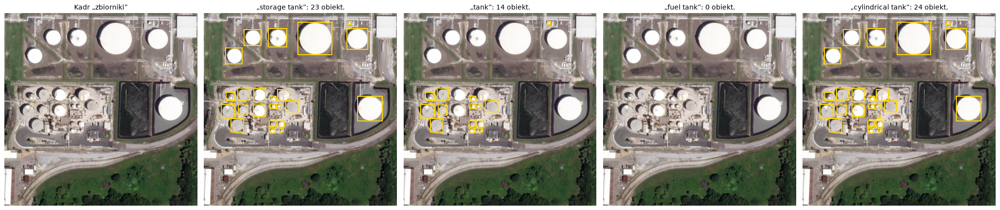

In [13]:
WARIANTY_ZBIORNIKI = ["storage tank", "tank", "fuel tank", "cylindrical tank"]
warianty_z = {f: znajdz_obiekty(cechy_zbiorniki, rozmiar_zbiorniki, f) for f in WARIANTY_ZBIORNIKI}
pokaz_pojecia(kadr_zbiorniki, warianty_z, "Kadr „zbiorniki”", kolor="gold")
pd.DataFrame({f: {"obiektów": len(o), "najwyższa pewność": max((x["wynik"] for x in o), default=np.nan)}
             for f, o in warianty_z.items()}).T.round(2)

,obiektów,najwyższa pewność
swimming pool,7.0,0.89
pool,7.0,0.90
rooftop pool,0.0,NaN
building,33.0,0.89
house,0.0,NaN


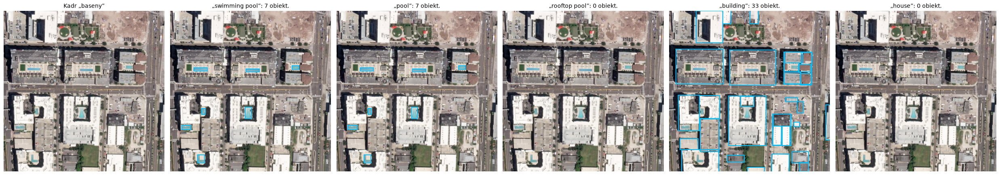

In [14]:
WARIANTY_BASENY = ["swimming pool", "pool", "rooftop pool", "building", "house"]
cechy_baseny, rozmiar_baseny = koduj_obraz(kadr_baseny)
warianty_b = {f: znajdz_obiekty(cechy_baseny, rozmiar_baseny, f) for f in WARIANTY_BASENY}
pokaz_pojecia(kadr_baseny, warianty_b, "Kadr „baseny”", kolor="deepskyblue")
pd.DataFrame({f: {"obiektów": len(o), "najwyższa pewność": max((x["wynik"] for x in o), default=np.nan)}
             for f, o in warianty_b.items()}).T.round(2)

Kafel 200 m = 400 px, zakładka 40 m
Kafli policzonych: 156, czas: 275 s (1.76 s/kafel przy 3 frazach)


,obiektów,mediana pewności
storage tank,92.0,0.71
swimming pool,36.0,0.86
building,1033.0,0.79


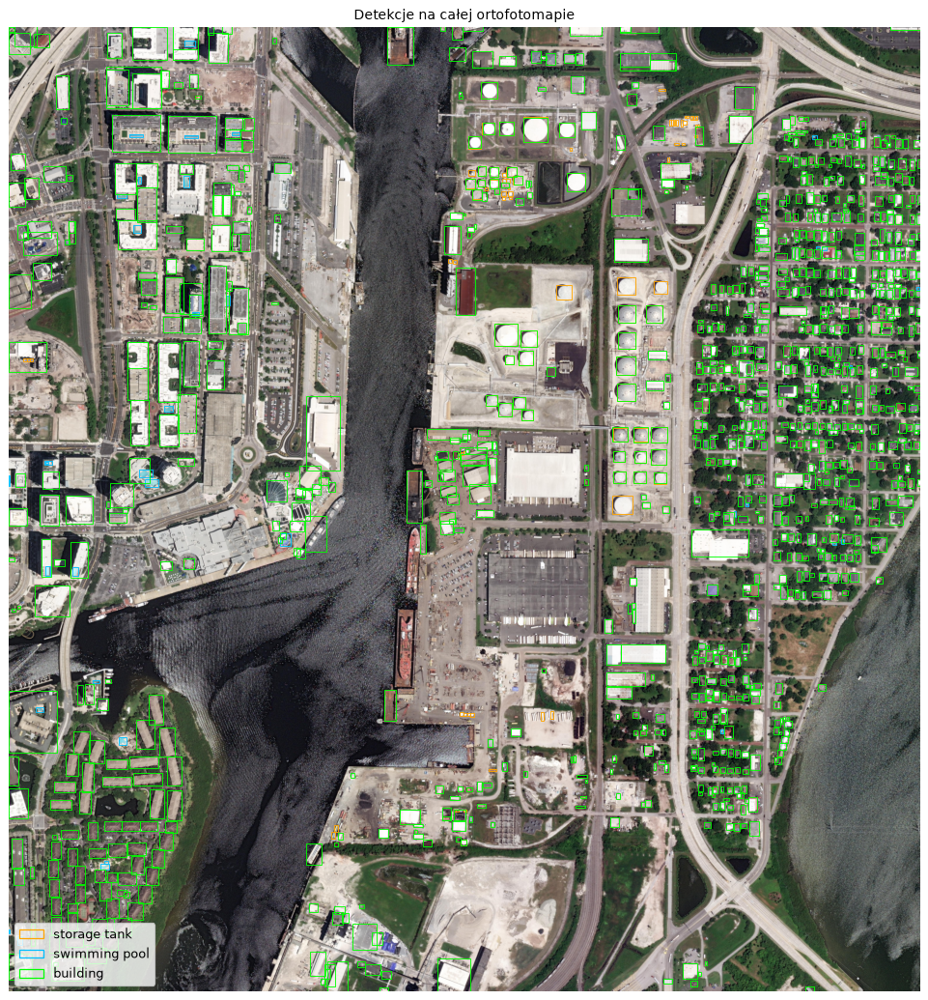

In [15]:
KAFEL_M, ZAKLADKA_M = 200, 40
POJECIA = list(POJECIE_NA_WARSTWE)


def poczatki_kafli(n, kafel, zakladka):
    """Początki kafli o boku `kafel` px, równomiernie pokrywających `n` px, z zakładką nie mniejszą niż `zakladka`."""
    if n <= kafel:
        return [0]
    liczba = int(np.ceil((n - zakladka) / (kafel - zakladka)))
    return np.linspace(0, n - kafel, liczba).round().astype(int).tolist()


def iou_ramek(a, b):
    """IoU dwóch ramek (x1, y1, x2, y2)."""
    x1, y1, x2, y2 = a; X1, Y1, X2, Y2 = b
    xi1, yi1, xi2, yi2 = max(x1, X1), max(y1, Y1), min(x2, X2), min(y2, Y2)
    if xi2 <= xi1 or yi2 <= yi1:
        return 0.0
    przeciecie = (xi2 - xi1) * (yi2 - yi1)
    suma = (x2 - x1) * (y2 - y1) + (X2 - X1) * (Y2 - Y1) - przeciecie
    return przeciecie / suma if suma > 0 else 0.0


def detekcje_kafelkami(rgb, waznie, pojecia, gsd, kafel_m=KAFEL_M, zakladka_m=ZAKLADKA_M, prog=PROG, iou_dedup=0.5):
    """SAM 3 na kafelkach z zakładką, dla każdej frazy. Zwraca {fraza: obiekty w układzie całego zdjęcia}."""
    wys_zdj, szer_zdj = waznie.shape
    kafel, zakladka = round(kafel_m / gsd), round(zakladka_m / gsd)
    kandydaci = {p: [] for p in pojecia}
    n_kafli = 0
    for w0 in poczatki_kafli(wys_zdj, kafel, zakladka):
        for k0 in poczatki_kafli(szer_zdj, kafel, zakladka):
            okno = np.s_[w0:w0 + kafel, k0:k0 + kafel]
            wys_k, szer_k = waznie[okno].shape
            if waznie[okno].mean() < 0.05:
                continue
            n_kafli += 1
            cechy, rozmiar = koduj_obraz(rgb[okno].copy())
            for p in pojecia:
                for o in znajdz_obiekty(cechy, rozmiar, p, prog, w0, k0):
                    x1, y1, x2, y2 = o["ramka"]
                    x1, y1, x2, y2 = x1 - k0, y1 - w0, x2 - k0, y2 - w0     # w układzie kafla
                    ucieta = ((x1 <= 0.5 and k0 > 0) or (y1 <= 0.5 and w0 > 0)
                              or (x2 >= szer_k - 0.5 and k0 + szer_k < szer_zdj)
                              or (y2 >= wys_k - 0.5 and w0 + wys_k < wys_zdj))
                    if not ucieta:
                        kandydaci[p].append(o)
    wynik = {}
    for p, lista in kandydaci.items():
        lista.sort(key=lambda o: -o["wynik"])
        zostawione = []
        for o in lista:
            if all(iou_ramek(o["ramka"], z["ramka"]) < iou_dedup for z in zostawione):
                zostawione.append(o)
        wynik[p] = zostawione
    return wynik, n_kafli


kafel_px = round(KAFEL_M / gsd)
print(f"Kafel {KAFEL_M} m = {kafel_px} px, zakładka {ZAKLADKA_M} m")

t0 = time.perf_counter()
obiekty_cale, n_kafli = detekcje_kafelkami(rgb, waznie, POJECIA, gsd)
czas_kafle = time.perf_counter() - t0
print(f"Kafli policzonych: {n_kafli}, czas: {czas_kafle:.0f} s ({czas_kafle / n_kafli:.2f} s/kafel przy {len(POJECIA)} frazach)")

fig, ax = plt.subplots(figsize=(11, 11.6))
ax.imshow(rgb)
for fraza, obiekty in obiekty_cale.items():
    for o in obiekty:
        x1, y1, x2, y2 = o["ramka"]
        ax.add_patch(Rectangle((x1, y1), x2 - x1, y2 - y1, fill=False, ec=KOLORY[fraza], lw=0.7))
ax.legend(handles=[Patch(edgecolor=c, facecolor="none", label=f) for f, c in KOLORY.items()], loc="lower left")
ax.axis("off"); ax.set_title("Detekcje na całej ortofotomapie")
plt.tight_layout()

pd.DataFrame({f: {"obiektów": len(o), "mediana pewności": np.median([x["wynik"] for x in o]) if o else np.nan}
             for f, o in obiekty_cale.items()}).T.round(2)

In [16]:
KOLUMNY_GDF = ["id", "pojecie", "klasa", "wynik", "pow_m2", "geometry"]


def ramki_do_gdf(obiekty_wg_frazy, profil, gsd, pojecie_na_klasa=POJECIE_NA_WARSTWE):
    """{fraza: obiekty} -> GeoDataFrame: prostokąt w układzie mapy + fraza, klasa, pewność, powierzchnia."""
    wiersze = []
    for fraza, lista in obiekty_wg_frazy.items():
        for o in lista:
            x1, y1, x2, y2 = o["ramka"]
            (mx1, my1) = profil["transform"] * (x1, y2)
            (mx2, my2) = profil["transform"] * (x2, y1)
            wiersze.append({"id": len(wiersze) + 1, "pojecie": fraza, "klasa": pojecie_na_klasa[fraza],
                            "wynik": round(o["wynik"], 2), "pow_m2": round((x2 - x1) * (y2 - y1) * gsd ** 2, 1),
                            "geometry": skrzynka(mx1, my1, mx2, my2)})
    return gpd.GeoDataFrame(pd.DataFrame(wiersze, columns=KOLUMNY_GDF), geometry="geometry", crs=profil["crs"])


gdf_det = ramki_do_gdf(obiekty_cale, profil, gsd)
sciezka_gpkg = KATALOG_WYNIKOW / "tampa_detekcje.gpkg"
sciezka_gpkg.unlink(missing_ok=True)
gdf_det.to_file(sciezka_gpkg, layer="detekcje", driver="GPKG")
plt.imsave(KATALOG_WYNIKOW / "tampa_detekcje_podglad.png", rgb)

print(f"{len(gdf_det)} obiektów -> {sciezka_gpkg}")
gdf_det.drop(columns="geometry").groupby("klasa").agg(obiektow=("id", "size"), pow_m2=("pow_m2", "sum"),
                                                        mediana_pewnosci=("wynik", "median")).round(2)

1161 obiektów -> wyniki/tampa_detekcja/tampa_detekcje.gpkg


,obiektow,pow_m2,mediana_pewnosci
klasa,,,
baseny,36,5532.7,0.86
budynki,1033,568584.6,0.79
zbiorniki,92,39226.1,0.71


In [18]:
def ocena_wzgledem_osm(gdf_det, sciezka_osm, pojecie, warstwa):
    """Dopasowanie po przecięciu geometrii. Zwraca (liczba OSM, dopasowane OSM, liczba detekcji, detekcje bez OSM)."""
    gdf_osm = gpd.read_file(sciezka_osm, layer=warstwa)
    gdf_osm = gdf_osm[gdf_osm.is_valid & ~gdf_osm.is_empty].reset_index(drop=True)
    gdf_d = gdf_det[gdf_det["pojecie"] == pojecie].reset_index(drop=True)

    osm_dopasowane = gpd.sjoin(gdf_osm, gdf_d, predicate="intersects", how="left")["index_right"].notna()
    osm_dopasowane = osm_dopasowane.groupby(level=0).any()
    det_dopasowane = gpd.sjoin(gdf_d, gdf_osm, predicate="intersects", how="left")["index_right"].notna()
    det_dopasowane = det_dopasowane.groupby(level=0).any()

    return {"OSM (referencja)": len(gdf_osm), "OSM dopasowanych": int(osm_dopasowane.sum()),
            "przybliżona czułość": round(osm_dopasowane.mean(), 3) if len(gdf_osm) else np.nan,
            "detekcji SAM 3": len(gdf_d), "detekcji bez OSM": int((~det_dopasowane).sum())}


ocena = pd.DataFrame({p: ocena_wzgledem_osm(gdf_det, SCIEZKA_OSM, p, w) for p, w in POJECIE_NA_WARSTWE.items()}).T
ocena

,OSM (referencja),OSM dopasowanych,przybliżona czułość,detekcji SAM 3,detekcji bez OSM
storage tank,82.0,60.0,0.732,92.0,33.0
swimming pool,19.0,14.0,0.737,36.0,21.0
building,981.0,845.0,0.861,1033.0,159.0


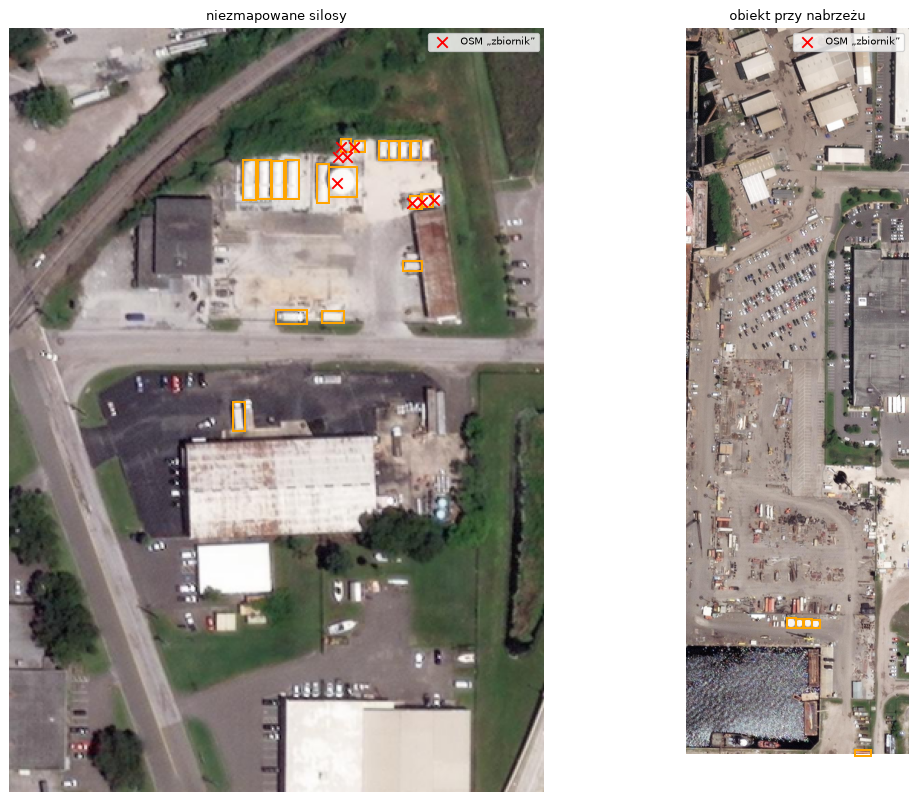

In [19]:
osm_zbiorniki = gpd.read_file(SCIEZKA_OSM, layer="zbiorniki")
osm_col = (osm_zbiorniki.geometry.centroid.x - profil["transform"].c) / profil["transform"].a
osm_row = (osm_zbiorniki.geometry.centroid.y - profil["transform"].f) / profil["transform"].e

REGIONY_PRZYKLADOWE = {
    "niezmapowane silosy": np.s_[300:800, 2600:2950],
    "obiekt przy nabrzeżu": np.s_[1800:3100, 1700:2100],
}
fig, ax = plt.subplots(1, 2, figsize=(13, 9))
for a, (tytul, frag) in zip(ax, REGIONY_PRZYKLADOWE.items()):
    w0, k0 = frag[0].start, frag[1].start
    a.imshow(rgb[frag])
    for o in obiekty_cale["storage tank"]:
        x1, y1, x2, y2 = o["ramka"]
        if frag[1].start <= x1 <= frag[1].stop and frag[0].start <= y1 <= frag[0].stop:
            a.add_patch(Rectangle((x1 - k0, y1 - w0), x2 - x1, y2 - y1, fill=False, ec="orange", lw=1.6))
    maska = (osm_col >= frag[1].start) & (osm_col <= frag[1].stop) & (osm_row >= frag[0].start) & (osm_row <= frag[0].stop)
    a.scatter(osm_col[maska] - k0, osm_row[maska] - w0, marker="x", c="red", s=70, label="OSM „zbiornik”")
    a.set_title(tytul, fontsize=10); a.legend(loc="upper right", fontsize=8); a.axis("off")
plt.tight_layout()